<a href="https://colab.research.google.com/github/momowade221/Notebook_Segmentation_Client_OM/blob/dev/OM_Segmentation_client_OM_new.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **CONFIGURATION**

---



In [ ]:
!pip install pyspark
# !pip install squarify
# !pip install lifetimes
# !pip install kmodes

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 316.9/316.9 MB 1.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyspark: filename=pyspark-3.5.0-py2.py3-none-any.whl size=317425345 sha256=dde3ccc27ef87778b7f85a715a2fc649c695a26400be293275b21b484eff6525
  Stored in directory: /root/.cache/pip/wheels/41/4e/10/c2cf2467f71c678cfc8a6b9ac9241e5e44a01940da8fbb17fc
Successfully built pyspark


In [ ]:
import sys
print(sys.version)

3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]


In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/Colab/Segmentation/
# myPath='/content/drive/MyDrive/Colab/Segmentation/#datasets_OM'

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from pyspark.sql import SparkSession
from pyspark.sql import DataFrame
from pyspark.sql.functions import *
from pyspark.sql.types import *
from pyspark.sql.window import *
from pyspark.ml.feature import *
from pyspark.ml import *
from pyspark.ml.clustering import *
from pyspark.ml.evaluation import ClusteringEvaluator
from pyspark.sql.column import Column


import sklearn
import matplotlib.gridspec as gridspec
import plotly.graph_objects as go
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import colors as mcolors
from scipy.stats import linregress
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score, adjusted_rand_score
from sklearn.cluster import KMeans
from tabulate import tabulate
from collections import Counter

spark = SparkSession.builder.appName("Transactions_OM").getOrCreate()
# Configuration pour permettre l'analyse des dates au format Legacy
# spark.conf.set("spark.sql.legacy.timeParserPolicy", "LEGACY")
spark

Mounted at /content/drive
/content/drive/MyDrive/Colab/Segmentation


In [ ]:
print(sklearn.__version__)

1.2.2


# **PRÉPARATION DES DONNÉES**

---



## **Collection des données**

In [ ]:
#Selection des données sur Hive
""" SELECT * FROM `trusted_om`.`base_transaction_om` WHERE day >= '20230801' AND day <= '20230831'
 ORDER BY RAND() LIMIT 100000; """

" SELECT * FROM `trusted_om`.`base_transaction_om` WHERE day >= '20230801' AND day <= '20230831'\n ORDER BY RAND() LIMIT 100000; "

In [ ]:

# # MySQL connection properties
# mysql_properties = {
#     "url": "jdbc:mysql://10.137.21.115:6446",
#     "user": "u_vente_rebond",
#     "password": "S0n@telV3nteReb0nd2023",
#     "dbtable": "your_table_name"  # Replace with your actual table name
# }

# # Read data from MySQL into a DataFrame
# df = spark.read \
#     .format("jdbc") \
#     .option("url", mysql_properties["url"]) \
#     .option("dbtable", mysql_properties["dbtable"]) \
#     .option("user", mysql_properties["user"]) \
#     .option("password", mysql_properties["password"]) \
#     .load()

# # Show the DataFrame
# df.show()


In [ ]:
myPath='/content/drive/MyDrive/Colab/Segmentation/#datasets_OM'

def df_load(path):
    # Charger le DataFrame depuis le fichier CSV avec les colonnes existantes
    df_loaded= spark.read.csv(f'{path}', header=True)
    # BaseTransaction OM - Renommer les colonnes
    # new_column_names = [col_name.replace(f"{table}.", "") for col_name in df_loaded.columns]
    # df_loaded = df_loaded.toDF(*new_column_names)
    return df_loaded

def pd_load(path):
    # Charger le DataFrame depuis le fichier CSV avec les colonnes existantes
    pd_loaded = pd.read_csv(path)
    # Renommer les colonnes
    # pd_loaded.columns = [col.replace(f"{table}.", "") for col in pd_loaded.columns]
    return pd_loaded
#OM
df_transaction_om= df_load(f'{myPath}/segmentation_base_transaction_om.csv')
# pd_transaction_om = pd_load(f'{myPath}/segmentation_base_transaction_om.csv')

# #Redefined reporting
df_segment_recharge=df_load(f'{myPath}/segmentation_recharge_segment.csv')
# pd_segment_recharge=pd_load(f'{myPath}/segmentation_recharge_segment.csv')

# #SICO
df_sico=df_load(f'{myPath}/segmentation_sico.csv')
# pd_sico = pd_load(f'{myPath}/segmentation_sico.csv')

#Localisaion
df_localisation=df_load(f'{myPath}/vente_rebond_location_night.csv')
# pd_localisation=pd_load(f'{myPath}/localisation.csv', 'location_day')

In [ ]:
# df_localisation=df_load(f'{myPath}/vente_rebond_location_night.csv')

# **MODÉLISATION POUR LA SEGMENTATION VALEUR K-MEANS**

---



### **Feature engineering**

In [ ]:
def df_km_create_sico(df_sico):
    taken_columns_sico = ['nd', 'date_naissance', 'date_debut_engagement', 'statut']
    df_km_sic = df_sico.select(taken_columns_sico) \
        .filter(df_sico["statut"] == "ACTIF") \
        .filter(df_sico["date_naissance"] != "NULL") \
        .withColumnRenamed("nd", "numero") \
        .drop("statut")
    df_km_sic = df_km_sic.withColumn("anciennete", year(current_date()) - year("date_debut_engagement")) \
        .withColumn("age", year(current_date()) - year("date_naissance")).drop("date_naissance") \
        .filter(col("age") > 10) \
        .filter(col("age") < 100) \
        .drop("date_debut_engagement")
    return df_km_sic


def df_km_create_ville(df_location):
    # Renommez la colonne commune_arrondissement en "ville"
    df_clients_top_villes = df_location.select("msisdn", "commune_arrondissement") \
        .withColumnRenamed("commune_arrondissement", "ville") \
        .withColumnRenamed("msisdn", "numero")

    # Remplacez les valeurs spécifiques
    replacements = {
        "NDAME": "TOUBA",
        "NIAYES": "KEUR MASSAR",
        "PIKINE DAGOUDANE": "PIKINE",
        "BAMBILOR": "SANGALKAM"
    }

    # Use when for replacements
    for old_value, new_value in replacements.items():
        df_clients_top_villes = df_clients_top_villes.withColumn("ville",
                                                                 when(col("ville") == old_value, new_value).otherwise(
                                                                     col("ville")))

    # Group by "numero" and select the most frequent "ville"
    df_clients_top_villes = df_clients_top_villes.groupBy("numero", "ville") \
        .agg(count("*").alias("count")) \
        .orderBy(desc("count")) \
        .groupBy("numero") \
        .agg(first("ville").alias("ville"))

    return df_clients_top_villes


def df_km_create_transaction_aggregated(df_transaction):
    # Convert "date" column to DateType
    df_transaction = df_transaction.withColumn("date", to_date(df_transaction["day"], 'yyyy/MM/dd'))

    latest_date = to_date(lit("2023/12/17"), 'yyyy/MM/dd')

    # Aggregate step 1
    df_km_transaction_aggregated1 = df_transaction.groupBy("numero") \
        .agg(datediff(latest_date, max(df_transaction["date"])).alias("recence"),
             count("*").alias("frequence_total"),
             sum(df_transaction["montant"].cast("double")).alias("montant_total"))

    # Aggregate step 2
    df_km_transaction_aggregated2 = df_transaction.filter(col("type_service") == "Transfert") \
        .groupBy("numero") \
        .agg(countDistinct("destinataire").alias("nombre_destinataires"),
             sum(when(col("destinataire") == col("numero"), 1).otherwise(0)).alias("nombre_receptions"))

    # Join the results
    df_km_transaction_aggregated = df_km_transaction_aggregated1.join(df_km_transaction_aggregated2, "numero", "inner")

    return df_km_transaction_aggregated



def df_km_create_transaction_categorie_service(df_transaction):
    # Créez un DataFrame vide pour stocker les résultats agrégés
    df_km_transaction_categorie = df_transaction

    # Liste des catégories de service uniques
    categories_services = ['service_financier', 'service_paiement', 'service_achat', 'don_cotisation']

    # Utilisez une boucle pour créer des colonnes de montant et de fréquence pour chaque catégorie de service
    for categorie in categories_services:
        # Créez une colonne temporaire pour le montant de la catégorie de service
        col_montant = f"montant_{categorie}"
        df_km_transaction_categorie = df_km_transaction_categorie.withColumn(col_montant, when(
            df_km_transaction_categorie["categorie_service"] == categorie,
            df_km_transaction_categorie["montant"]).otherwise(0))

        # Créez une colonne temporaire pour la fréquence de la catégorie de service
        col_frequence = f"frequence_{categorie}"
        df_km_transaction_categorie = df_km_transaction_categorie.withColumn(col_frequence, when(
            df_km_transaction_categorie["categorie_service"] == categorie, 1).otherwise(0))

    # Effectuez l'agrégation en regroupant par d'autres colonnes si nécessaire
    df_km_transaction_categorie = df_km_transaction_categorie.groupBy("numero").sum()

    # Renommez les colonnes agrégées
    for categorie in categories_services:
        col_montant = f"montant_{categorie}"
        col_frequence = f"frequence_{categorie}"
        df_km_transaction_categorie = df_km_transaction_categorie.withColumnRenamed(f"sum({col_montant})", col_montant) \
            .withColumnRenamed(f"sum({col_frequence})", col_frequence) \
            .drop("sum(montant)")

    return df_km_transaction_categorie


def df_km_create_segment_palier(result_segment_palier):
    # Integration des donnés de la segmentation palier
    taken_columns_palier = ['numero', 'palier_inf', 'palier_sup']
    df_km_palier = result_segment_palier.select(taken_columns_palier) \
        .withColumn("palier_inf", col("palier_inf").cast("double")) \
        .withColumn("palier_sup", col("palier_sup").cast("double"))
    return df_km_palier


def df_km_create_segment_multiservice(result_segment_multiservice):
    # Integration des donnés de la segmentation multiservice
    taken_columns_multiservice = ["numero", "nombre_services", "nombre_canaux"]
    df_km_segment_multiservice = result_segment_multiservice.select(taken_columns_multiservice)
    return df_km_segment_multiservice


def df_km_create_segment_recharge(df_segment_recharge):
    # Intégration des données de la segmentation recharge
    max_year_df_km_recharge = df_segment_recharge.agg({"year": "max"}).collect()[0][0]
    max_month_df_km_recharge = df_segment_recharge.filter(col("year") == max_year_df_km_recharge) \
        .agg({"month": "max"}).collect()[0][0]
    df_km_latest_segment_recharge = df_segment_recharge.withColumnRenamed("msisdn", "numero") \
        .withColumnRenamed("avg_montant_recharge", "latest_avg_montant_recharge") \
        .filter((col("year") == max_year_df_km_recharge) & (col("month") == max_month_df_km_recharge)) \
        .select("numero", "latest_avg_montant_recharge") \
        .withColumn("latest_avg_montant_recharge", col("latest_avg_montant_recharge").cast("double"))
    return df_km_latest_segment_recharge


def df_kmeans_create(df_sico, df_transaction, *dataframes_to_join):
    df_sic = df_km_create_sico(df_sico)
    df_km_created = df_sic

    for df_km_to_join in dataframes_to_join:
        df_km_created = df_km_created.join(df_km_to_join, "numero", "inner")
    return df_km_created




#### Sélection de variables

In [ ]:
df_transaction_prepared_kmeans = df_transaction_transform(df_transaction_clean(df_transaction_om))
df_segment_multiservice_km = segmenter_multiservice(df_transaction_prepared_kmeans)
df_segment_palier_km = segmenter_palier(df_transaction_prepared_kmeans)
# Appel de la fonction df_kmeans_create avec les DataFrames en tant qu'arguments
df_kmeans_created_init = df_kmeans_create(
    df_sico,
    df_transaction_prepared_kmeans,
    df_km_create_ville(df_localisation),
    df_km_create_transaction_aggregated(df_transaction_prepared_kmeans),
    df_km_create_segment_palier(df_segment_palier_km),
    df_km_create_segment_recharge(df_segment_recharge),
    df_km_create_segment_multiservice(df_segment_multiservice_km),
    df_km_create_transaction_categorie_service(df_transaction_prepared_kmeans)
)


ERROR:root:KeyboardInterrupt while sending command.
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/py4j/java_gateway.py", line 1038, in send_command
    response = connection.send_command(command)
  File "/usr/local/lib/python3.10/dist-packages/py4j/clientserver.py", line 511, in send_command
    answer = smart_decode(self.stream.readline()[:-1])
  File "/usr/lib/python3.10/socket.py", line 705, in readinto
    return self._sock.recv_into(b)
KeyboardInterrupt


KeyboardInterrupt: 

In [ ]:
df_kmeans_created_init.toPandas().to_csv('#datasets_OM/dataset_for_kmeans.csv', , index=False)

#### Encodage des variables

In [ ]:

def df_kmeans_encode(df_to_encode: DataFrame, categorical_columns: list):
    # Encodage des variables catégorielles
    # Initialiser les étapes pour le pipeline
    df_to_encode = df_to_encode
    etapes = []

    # Appliquer StringIndexer pour l'encodage des étiquettes
    for col in categorical_columns:
        indexer = StringIndexer(inputCol=col, outputCol=col + "_index")
        etapes.append(indexer)

    # Créer un pipeline
    pipeline = Pipeline(stages=etapes)

    # Ajuster et transformer le DataFrame à l'aide du pipeline
    model = pipeline.fit(df_to_encode)
    df_encoded = model.transform(df_to_encode) \
        # .drop(*categorical_columns)
    return df_encoded



In [ ]:
df_kmeans_encoded = df_kmeans_encode(df_kmeans_created_init, categorical_columns=["ville"])
pd_kmeans_encoded = df_kmeans_encoded.toPandas()

Nombre de features: 22
root
 |-- numero: string (nullable = true)
 |-- anciennete: integer (nullable = true)
 |-- age: integer (nullable = true)
 |-- ville: string (nullable = true)
 |-- recence: integer (nullable = true)
 |-- frequence_total: long (nullable = false)
 |-- montant_total: double (nullable = true)
 |-- nombre_destinataires: long (nullable = false)
 |-- palier_inf: double (nullable = true)
 |-- palier_sup: double (nullable = true)
 |-- latest_avg_montant_recharge: double (nullable = true)
 |-- nombre_services: integer (nullable = false)
 |-- nombre_canaux: integer (nullable = false)
 |-- montant_service_financier: double (nullable = true)
 |-- frequence_service_financier: long (nullable = true)
 |-- montant_service_paiement: double (nullable = true)
 |-- frequence_service_paiement: long (nullable = true)
 |-- montant_service_achat: double (nullable = true)
 |-- frequence_service_achat: long (nullable = true)
 |-- montant_don_cotisation: double (nullable = true)
 |-- freque

In [ ]:
df_kmeans_encoded.count()

132754

#### Normalisation des variables

In [ ]:
def df_km_scale(pd_dataframe, features_to_exclude):
    # Initialize the StandardScaler
    scaler = StandardScaler()
    # List of columns that need to be scaled
    columns_to_scale = pd_dataframe.columns.difference(features_to_exclude)

    # Copy the dataset
    scaled_dataframe = pd_dataframe.copy()

    # Applying the scaler to the necessary columns in the dataset
    scaled_dataframe[columns_to_scale] = scaler.fit_transform(scaled_dataframe[columns_to_scale])

    return scaled_dataframe

In [ ]:
features_to_exclude_scale = ['numero', 'ville']
features_to_exclude_train = ['numero', 'ville']
# Specify the correct column name in the categorical_columns parameter
pd_kmeans_scaled = df_km_scale(pd_kmeans_encoded, features_to_exclude_scale)
# Colonnes
km_feature_columns = pd_kmeans_scaled.columns.difference(features_to_exclude_train)


,numero,anciennete,age,ville,recence,frequence_total,montant_total,nombre_destinataires,palier_inf,palier_sup,...,nombre_canaux,montant_service_financier,frequence_service_financier,montant_service_paiement,frequence_service_paiement,montant_service_achat,frequence_service_achat,montant_don_cotisation,frequence_don_cotisation,ville_index
0,1000001,1.019919,-0.506582,PIKINE,1.370186,-0.403261,-0.336458,-0.549933,-0.474822,-0.126301,...,-0.910105,-0.299534,-0.357416,-0.130249,-0.348911,0.267896,0.107730,-0.008496,-0.015273,-0.290803
1,1000054,-0.188042,1.668411,DIOURBEL,0.272114,-0.696569,-0.398719,-0.549933,-0.474822,-0.126301,...,-0.910105,-0.363477,-0.643841,-0.130249,-0.348911,-0.145847,-0.270924,-0.008496,-0.015273,0.312528
2,1000298,0.053550,-0.023250,GRAND DAKAR,-0.646682,-0.872554,-0.413400,-0.549933,-0.474822,-0.126301,...,-0.910105,-0.374009,-0.739315,-0.130249,-0.348911,-0.544636,-0.649578,-0.008496,-0.015273,-0.449575
3,1000339,-1.396002,-0.748247,MABO,-0.646682,-0.696569,-0.346602,-0.549933,-0.200731,-0.121053,...,-0.910105,-0.298707,-0.452891,-0.130249,-0.348911,-0.544636,-0.649578,-0.008496,-0.015273,5.583741
4,1000708,-0.671226,-0.345471,THIES,-0.153670,0.711309,0.384602,-0.197157,0.621541,-0.100474,...,1.074550,0.142124,0.597333,0.255290,0.059503,-0.215635,-0.460251,-0.008496,-0.015273,-0.386066


### **Modele 1 (sklearn)**

#### Matrice de corrélation

<ipython-input-16-a857fa03bebf>:10: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = dataframe.drop(columns=['numero']).corr()


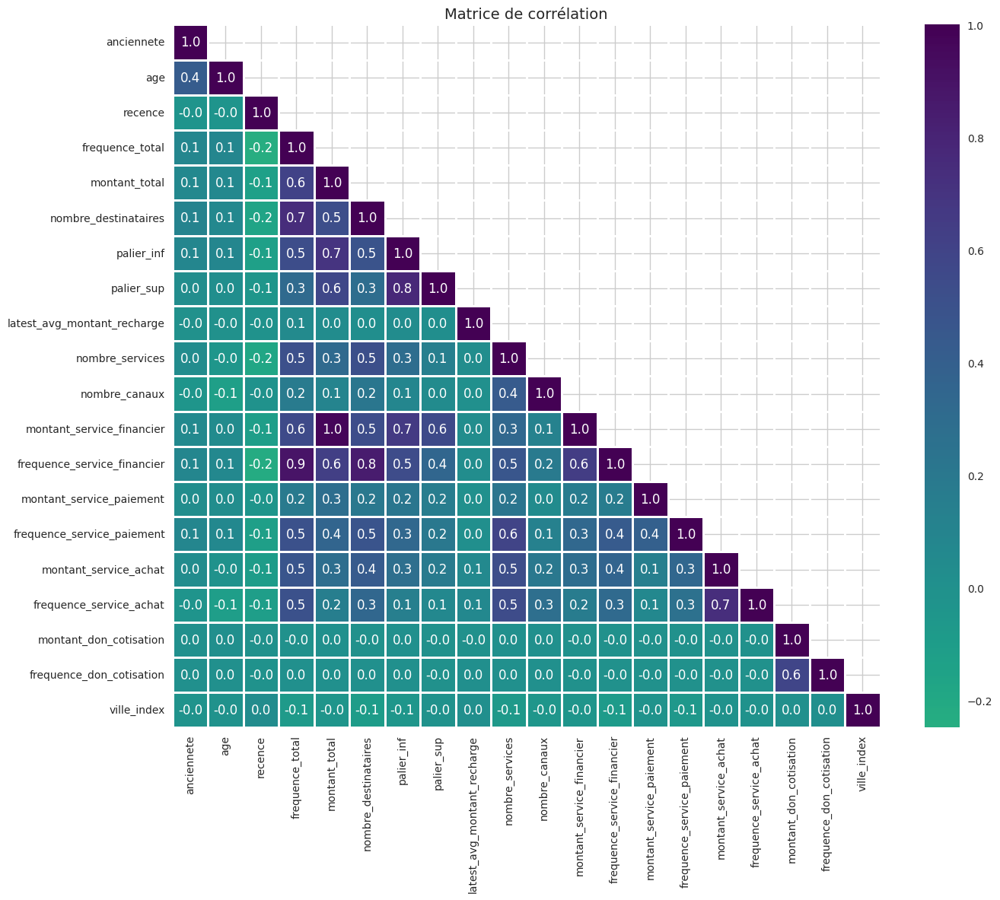

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_correlation_matrix(dataframe):
    # Reset background style
    sns.set_style('whitegrid')

    # Calculate the correlation matrix excluding certain columns
    corr = dataframe.drop(columns=['numero']).corr()

    # Create a mask to only show the lower triangle of the matrix
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask, k=1)] = True

    # Plot the heatmap
    plt.figure(figsize=(15, 12))
    sns.heatmap(corr, mask=mask, annot=True, center=0, cmap="viridis_r", fmt='.1f', linewidths=2)
    plt.title('Matrice de corrélation', fontsize=14)
    plt.show()

# Usage example:
plot_correlation_matrix(pd_kmeans_scaled)


#### Réduction de dimension avec ACP

##### Nombre de dimensions

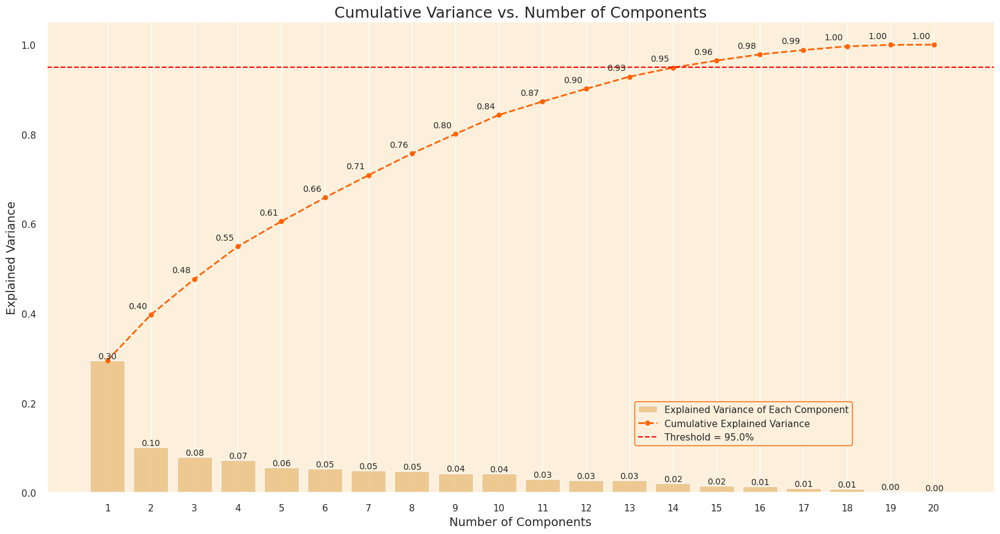

Number of components to reach 95.0% cumulative explained variance: 15


In [ ]:
# Setting CustomerID as the index column
pd_kmeans_scaled_topca=pd_kmeans_scaled.drop(['ville'], axis=1)
pd_kmeans_scaled_topca.set_index('numero', inplace=True)

# Apply PCA
pca = PCA().fit(pd_kmeans_scaled_topca)

# Calculate the Cumulative Sum of the Explained Variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# # Set seaborn plot style
sns.set(rc={'axes.facecolor': '#fcf0dc'}, style='darkgrid')

# Set a threshold for cumulative explained variance (e.g., 95%)
threshold = 0.95

# Find the number of components that meet the threshold
num_components = np.argmax(cumulative_explained_variance >= threshold) + 1

# Plot the cumulative explained variance against the number of components
plt.figure(figsize=(20, 10))

# Bar chart for the explained variance of each component
barplot = sns.barplot(x=list(range(1, len(cumulative_explained_variance) + 1)),
                      y=explained_variance_ratio,
                      color='#fcc36d',
                      alpha=0.8)

# Line plot for the cumulative explained variance
lineplot, = plt.plot(range(0, len(cumulative_explained_variance)), cumulative_explained_variance,
                     marker='o', linestyle='--', color='#ff6200', linewidth=2)

# Plot a vertical line at the chosen threshold
threshold_line = plt.axhline(threshold, color='red', linestyle='--', label=f'Threshold = {threshold * 100}%')

# Set labels and title
plt.xlabel('Number of Components', fontsize=14)
plt.ylabel('Explained Variance', fontsize=14)
plt.title('Cumulative Variance vs. Number of Components', fontsize=18)

# Customize ticks and legend
plt.xticks(range(0, len(cumulative_explained_variance)))
plt.legend(handles=[barplot.patches[0], lineplot, threshold_line],
           labels=['Explained Variance of Each Component', 'Cumulative Explained Variance', f'Threshold = {threshold * 100}%'],
           loc=(0.62, 0.1),
           frameon=True,
           framealpha=1.0,
           edgecolor='#ff6200')

# Display the variance values for both graphs on the plots
x_offset = -0.3
y_offset = 0.01
for i, (ev_ratio, cum_ev_ratio) in enumerate(zip(explained_variance_ratio, cumulative_explained_variance)):
    plt.text(i, ev_ratio, f"{ev_ratio:.2f}", ha="center", va="bottom", fontsize=10)
    if i > 0:
        plt.text(i + x_offset, cum_ev_ratio + y_offset, f"{cum_ev_ratio:.2f}", ha="center", va="bottom", fontsize=10)

plt.grid(axis='both')
plt.show()

# Display the number of components needed to reach the threshold
print(f'Number of components to reach {threshold * 100}% cumulative explained variance: {num_components}')


##### Application de l'ACP

In [ ]:
from sklearn.decomposition import PCA

def apply_pca(dataframe, n_components):
    """
    Apply Principal Component Analysis (PCA) to the given dataframe.

    Parameters:
    - dataframe: The input dataframe.
    - n_components: The number of principal components to retain.

    Returns:
    - pca_dataframe: The dataframe with PCA-transformed features.
    """
    new_columns=dataframe.columns.difference(['ville'])
    new_dataframe= dataframe[new_columns]
    # Creating a PCA object with specified components
    pca = PCA(n_components=n_components)

    # Fitting and transforming the original data to the new PCA dataframe
    pca_dataframe = pca.fit_transform(new_dataframe)

    # Creating a new dataframe from the PCA dataframe
    pca_dataframe = pd.DataFrame(pca_dataframe, columns=[f'PC{i+1}' for i in range(pca.n_components_)])

    # Adding the index back to the new PCA dataframe
    pca_dataframe.index = dataframe.index

    return pca_dataframe

# Usage example:
pd_kmeans_pca = apply_pca(pd_kmeans_encoded, n_components=6)
pd_kmeans_scaled_pca = apply_pca(pd_kmeans_scaled, n_components=6)
pca_columns=pd_kmeans_pca.columns
pd_kmeans_pca.head()


,PC1,PC2,PC3,PC4,PC5,PC6
0,-1.488585e+06,-248631.796879,-316452.418017,-29507.538857,-21074.155390,44891.246134
1,-1.491879e+06,-311458.336465,-316351.614637,-27821.772494,-23160.398185,40055.388585
2,-1.492508e+06,-323324.515223,-315857.600364,-6657.684361,142633.847531,42477.497629
3,-1.427148e+06,-253214.844357,-316113.180636,-26982.634740,-22523.552366,-5028.769493
4,-1.154024e+06,348245.054875,-316327.564061,131673.594157,-21001.570061,-80247.840527


In [ ]:
# #Now, let's extract the coefficients corresponding to each principal component to better understand the transformation performed by PCA

# # Define a function to highlight the top 3 absolute values in each column of a dataframe
# def highlight_top3(column):
#     top3 = column.abs().nlargest(3).index
#     return ['background-color:  #ffeacc' if i in top3 else '' for i in column.index]

# # Create the PCA component DataFrame and apply the highlighting function
# pc_df = pd.DataFrame(pca.components_.T, columns=['PC{}'.format(i+1) for i in range(pca.n_components_)],
#                      index=pd_kmeans_scaled.columns)

# pc_df.style.apply(highlight_top3, axis=0)

#### Nombre de clusters

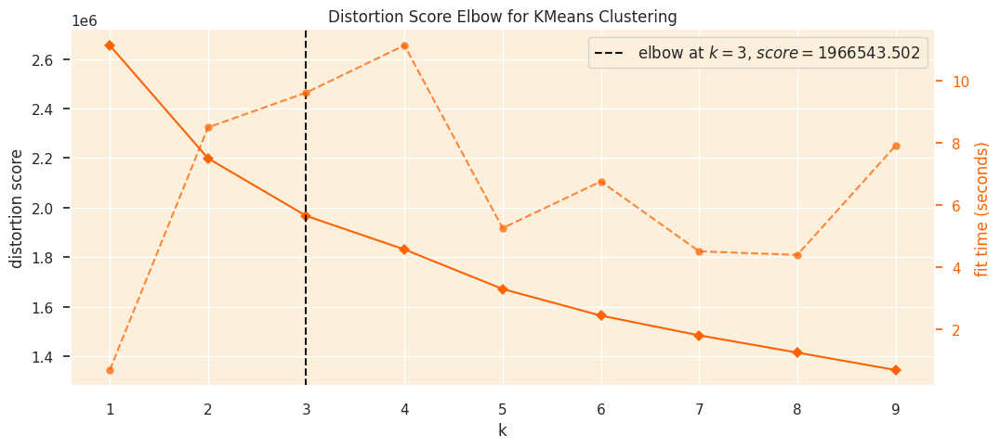

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from yellowbrick.cluster import KElbowVisualizer
from pyspark.sql import DataFrame

def visualize_elbow_method(pd_kmeans, feature_columns):
    # Select RFM columns for analysis
    pd_kmeans_features = pd_kmeans[feature_columns]

    # Set plot style, and background color
    sns.set(style='darkgrid', rc={'axes.facecolor': '#fcf0dc'})

    # Set the color palette for the plot
    sns.set_palette(['#ff6200'])

    # Standardize the features
    scaler = StandardScaler()
    kmeans_features_scaled = scaler.fit_transform(pd_kmeans_features)

    # Create an instance of the KElbowVisualizer with explicit n_init
    visualizer = KElbowVisualizer(KMeans(random_state=42, n_init=10), k=(1, 10))

    # Create a figure and axis with the desired size
    fig, ax = plt.subplots(figsize=(12, 5))

    # Adjust the model and the visualizer
    visualizer.fit(kmeans_features_scaled)

    # Suppress FutureWarning
    with warnings.catch_warnings():
        warnings.simplefilter(action='ignore', category=FutureWarning)
        visualizer.show()


visualize_elbow_method(pd_kmeans_encoded,km_feature_columns)

#### Entrainement du modele

In [ ]:
def apply_new_labels(dataframe, n_clusters, feature_columns):
    # Apply KMeans clustering
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', n_init=10, max_iter=100, random_state=0)
    new_dataframe = dataframe[feature_columns]
    kmeans.fit(new_dataframe)

    # Get the frequency of each cluster
    cluster_frequencies = Counter(kmeans.labels_)

    # Create a mapping from old labels to new labels based on frequency
    label_mapping = {label: new_label for new_label, (label, _) in enumerate(cluster_frequencies.most_common())}
    cluster_mapping = {2: 1, 1: 0, 0: 2}
    # Reverse the mapping to assign labels as per your criteria
    label_mapping = {v: k for k, v in cluster_mapping.items()}

    # Apply the mapping to get the new labels, handling the case where the key is not present
    new_labels = np.array([label_mapping.get(label, label) for label in kmeans.labels_])

    return new_labels


def apply_kmeans_clustering(dataframe, n_clusters, feature_columns=km_feature_columns):
    new_features1 = apply_new_labels(dataframe, n_clusters, feature_columns)
    # Create a new dataframe with the cluster labels
    clustered_dataframe = dataframe.copy()  # Use .copy() to avoid unintended modifications
    clustered_dataframe['cluster'] = new_features1
    return clustered_dataframe


def apply_kmeans_clustering2(dataframe, dataframe2, n_clusters, feature_columns=km_feature_columns):
    new_features2 = apply_new_labels(dataframe, n_clusters, feature_columns)
    # Create a new dataframe with the cluster labels
    clustered_dataframe2 = dataframe2.copy()  # Use .copy() to avoid unintended modifications
    clustered_dataframe2['cluster'] = new_features2
    return clustered_dataframe2

num_clusters=5
#Sans normalisation:
pd_segment_valeur = apply_kmeans_clustering(pd_kmeans_encoded, num_clusters)

#Normalisation
pd_segment_valeur_scaled= apply_kmeans_clustering(pd_kmeans_scaled, num_clusters)
pd_segment_valeur_scaled2 = apply_kmeans_clustering2(pd_kmeans_scaled,pd_kmeans_encoded, num_clusters)

#PCA
pd_segment_valeur_pca = apply_kmeans_clustering(pd_kmeans_pca,num_clusters,feature_columns= pca_columns)
pd_segment_valeur_pca2 = apply_kmeans_clustering2(pd_kmeans_pca,pd_kmeans_encoded,num_clusters,feature_columns= pca_columns)

#PCA et normalisation
pd_segment_valeur_scaled_pca = apply_kmeans_clustering(pd_kmeans_scaled_pca, num_clusters, feature_columns=pca_columns)
pd_segment_valeur_scaled_pca2 = apply_kmeans_clustering2(pd_kmeans_scaled_pca,pd_kmeans_encoded, num_clusters, feature_columns=pca_columns)

NameError: name 'km_feature_columns' is not defined

In [ ]:
pd_segment_valeur_scaled_pca.head()

#### Métrique d'évaluation

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from tabulate import tabulate

def compute_clustering_metrics(dataframe,columns_to_drop=['cluster', 'ville']):
    """
    Compute clustering metrics for a given dataframe with cluster labels.

    Parameters:
    - dataframe: The input dataframe with cluster labels.

    Returns:
    - None (prints the metrics table).
    """
    # Compute number of customers
    num_observations = len(dataframe)

    # Separate the features and the cluster labels
    X = dataframe.drop(columns_to_drop, axis=1)
    clusters = dataframe['cluster']

    # Compute the metrics
    sil_score = silhouette_score(X, clusters)
    # calinski_score = calinski_harabasz_score(X, clusters)
    davies_score = davies_bouldin_score(X, clusters)

    # Create a table to display the metrics and the number of observations
    table_data = [
        # ["Nombre d'observations", num_observations],
        ["Silhouette Score", sil_score],
        # ["Calinski Harabasz Score", calinski_score],
        ["Davies Bouldin Score", davies_score]]

    # Print the table
    print(tabulate(table_data, headers=["Métrique", "Valeur"], tablefmt='grid'))

# # Usage example
print("Sans normalisation")
compute_clustering_metrics(pd_segment_valeur)

print("\n\nAvec PCA")
compute_clustering_metrics(pd_segment_valeur_pca,['cluster'])

print("\n\nAvec normalisation")
compute_clustering_metrics(pd_segment_valeur_scaled)

print("\n\nAvec normalisation et PCA")
compute_clustering_metrics(pd_segment_valeur_scaled_pca,['cluster'])

Sans normalisation
+----------------------+----------+
| Métrique             |   Valeur |
+======================+==========+
| Silhouette Score     | 0.552641 |
+----------------------+----------+
| Davies Bouldin Score | 0.671191 |
+----------------------+----------+


Avec PCA
+----------------------+----------+
| Métrique             |   Valeur |
+======================+==========+
| Silhouette Score     | 0.488706 |
+----------------------+----------+
| Davies Bouldin Score | 0.699994 |
+----------------------+----------+


Avec normalisation
+----------------------+------------+
| Métrique             |     Valeur |
+======================+============+
| Silhouette Score     |  -0.188082 |
+----------------------+------------+
| Davies Bouldin Score | 227.084    |
+----------------------+------------+


Avec normalisation et PCA
+----------------------+------------+
| Métrique             |     Valeur |
+======================+============+
| Silhouette Score     |  -0.188082 |

####  Profilage  (Tendances centrales)

##### Approche Radar

Sans normalisation


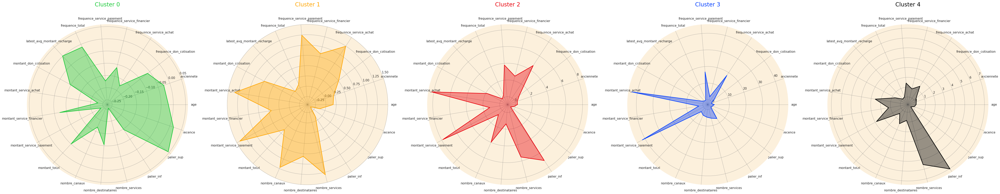



Avec PCA


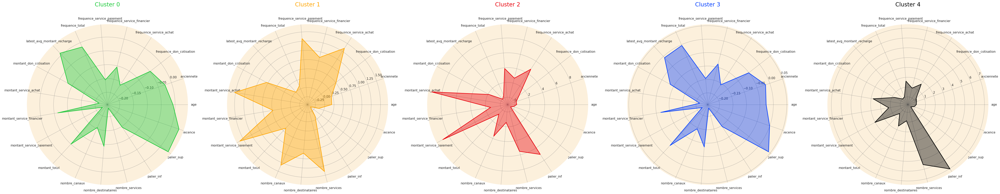



Avec normalisation


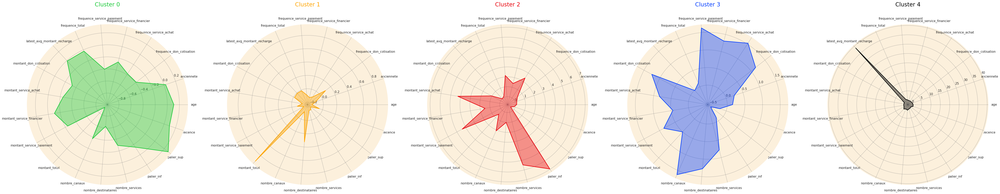



Avec normalisation et PCA


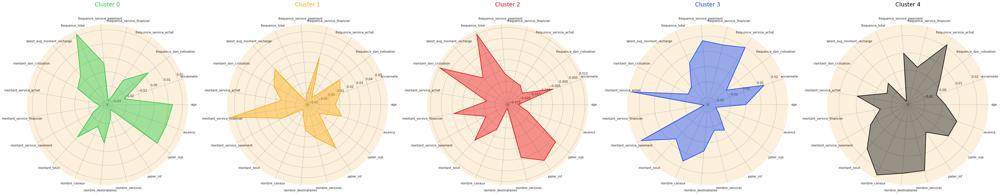

In [ ]:
def plot_radar_chart(dataframe):
    """
    Plot radar charts for each cluster using the centroid values.

    Parameters:
    - dataframe: The input dataframe with cluster labels.
    - colors: List of colors for the clusters.

    Returns:
    - None (displays the radar charts).
    """

    new_columns=dataframe.columns.difference(['ville'])
    new_dataframe= dataframe[new_columns]
    # Set 'CustomerID' column as index and assign it to a new dataframe
    df_customer = new_dataframe.set_index('numero')

    colors=[ '#1ac938','orange', '#e8000b', '#023eff', 'black']  # Add a color for the 5th cluster

    # Standardize the data (excluding the cluster column)
    scaler = StandardScaler()
    df_customer_standardized = scaler.fit_transform(df_customer.drop(columns=['cluster'], axis=1))

    # Create a new dataframe with standardized values and add the cluster column back
    df_customer_standardized = pd.DataFrame(df_customer_standardized, columns=df_customer.columns[:-1], index=df_customer.index)
    df_customer_standardized['cluster'] = df_customer['cluster']

    # Calculate the centroids of each cluster
    cluster_centroids = df_customer_standardized.groupby('cluster').mean()

    # Function to create a radar chart
    def create_radar_chart(ax, angles, data, color, cluster):
        # Plot the data and fill the area
        ax.fill(angles, data, color=color, alpha=0.4)
        ax.plot(angles, data, color=color, linewidth=2, linestyle='solid')

        # Add a title
        ax.set_title(f'Cluster {cluster}', size=20, color=color, y=1.1)

    # Set data
    labels = np.array(cluster_centroids.columns)
    num_vars = len(labels)

    # Compute angle of each axis
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

    # The plot is circular, so we need to "complete the loop" and append the start to the end
    labels = np.concatenate((labels, [labels[0]]))
    angles += angles[:1]

    # Get the number of clusters dynamically
    num_clusters = len(cluster_centroids)

    # Initialize the figure
    fig, ax = plt.subplots(figsize=(50, 30), subplot_kw=dict(polar=True), nrows=1, ncols=num_clusters)

    # Create radar chart for each cluster
    for i, color in enumerate(colors[:num_clusters]):  # Use only the required number of colors
        data = cluster_centroids.loc[i].tolist()
        data += data[:1]  # Complete the loop
        create_radar_chart(ax[i], angles, data, color, i)

    # Add input data
    for a in ax:
        a.set_xticks(angles[:-1])
        a.set_xticklabels(labels[:-1])

    # Add a grid
    for a in ax:
        a.grid(color='grey', linewidth=0.5)

    # Display the plot
    plt.tight_layout()
    plt.show()

# Usage example
print("Sans normalisation")
plot_radar_chart(pd_segment_valeur)

print("\n\nAvec PCA")
plot_radar_chart(pd_segment_valeur_pca2)

print("\n\nAvec normalisation")
plot_radar_chart(pd_segment_valeur_scaled2)

print("\n\nAvec normalisation et PCA")
plot_radar_chart(pd_segment_valeur_scaled_pca2)

##### Approche Histogramme



Avec normalisation


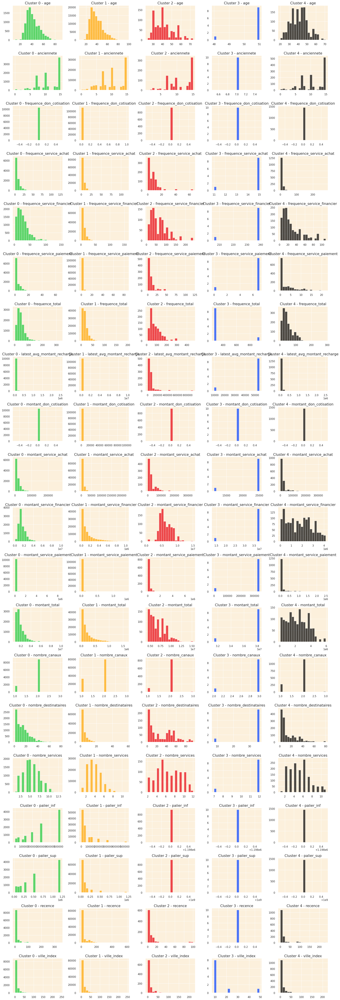

In [ ]:
def plot_cluster_histograms(data, feature_columns):
    """
    Plot histograms for each feature segmented by the clusters.

    Parameters:
    - data: DataFrame containing the data.
    - feature_columns: List of feature column names.
    - cluster_column: Name of the column containing cluster labels.
    - bins: Number of bins for the histograms.
    - colors: List of colors for each cluster.

    Returns:
    - None
    """

    colors=[ '#1ac938','orange', '#e8000b', '#023eff', 'black']
    cluster_column='cluster'
    clusters = data[cluster_column].unique()
    clusters.sort()

    # Setting up the subplots
    n_rows = len(feature_columns)
    n_cols = len(clusters)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 3 * n_rows))

    # Plotting histograms
    for i, feature in enumerate(feature_columns):
        for j, cluster in enumerate(clusters):
            cluster_data = data[data[cluster_column] == cluster][feature]
            axes[i, j].hist(cluster_data, bins=20, color=colors[j], edgecolor='w', alpha=0.7)
            axes[i, j].set_title(f'Cluster {cluster} - {feature}', fontsize=15)
            axes[i, j].set_xlabel('')
            axes[i, j].set_ylabel('')

    # Adjusting layout to prevent overlapping
    plt.tight_layout()
    plt.show()

# print("Sans normalisation")
# plot_cluster_histograms(pd_segment_valeur, km_feature_columns)

print("\n\nAvec normalisation")
plot_cluster_histograms(pd_segment_valeur, km_feature_columns)

# print("\n\nAvec PCA")
# plot_cluster_histograms(pd_segment_valeur_pca, km_feature_columns)

# print("\n\nAvec normalisation et PCA")
# plot_cluster_histograms(pd_segment_valeur_scaled_pca, km_feature_columns)


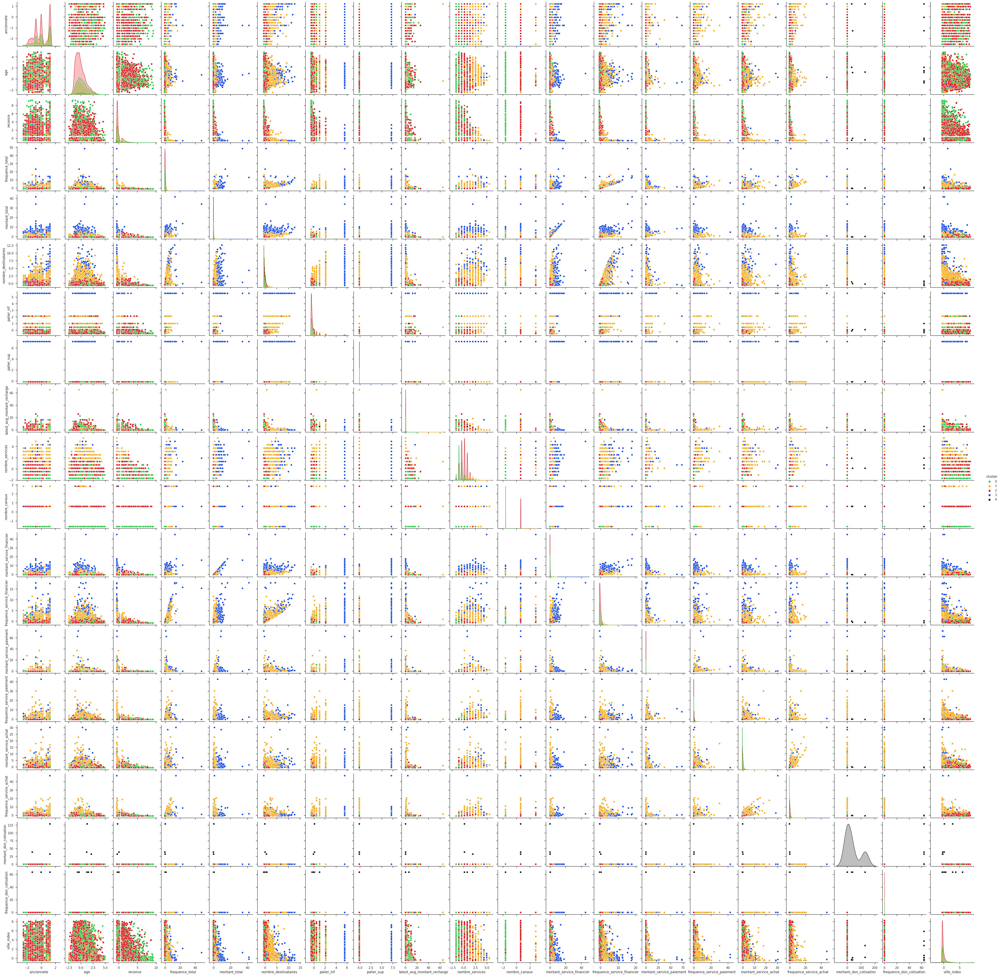

In [ ]:
def plot_pairplot(dataframe):
  # Définir la palette de couleurs
  pal=[ '#1ac938','orange', '#e8000b', '#023eff', 'black']
  # Créer le pairplot en utilisant la palette de couleurs
  sns.set(style="ticks")
  sns.pairplot(dataframe, hue="cluster", palette=pal)
  # Afficher le pairplot
  plt.show()

plot_pairplot(pd_segment_valeur_scaled)

##### Profils

- **Cluster 0**:
1.Montant_service_achat, montant_service_paiement, nombre_service, frequence_service, frequence_servie_achat
- **Cluster 1**:
1.Palier_sup

2.Lastest_avg_montant_recharge, frequence_total, montant_total, recence, anciennete

3.Frequence_service_financier
- **Cluster 2**
1.Palier_inf, montant_service_paiement, montant_service_achat

2.Frequence_service_achat,frequence_service_paiement,nombre_services,montant_service_paiement,montant_service_acaht

- **Cluster 3**
1.Montant_service_achat, montant_service_paiement

3.Frequence_service_paiement, frequence_service_achat

- **Cluster 4**
1.Palier_inf

2.Nombre_services

In [ ]:
def profiler_segmented_dataframe(original_dataframe, segment_labels):
    # Créer une copie du DataFrame existant
    df_final = original_dataframe.copy()

    # Ajouter la colonne 'segment' avec les valeurs correspondantes
    df_final['segment'] = df_final['cluster'].map(segment_labels).fillna('Autre')

    return df_final


num_clusters = 5
pd_segment_valeur = apply_kmeans_clustering(pd_kmeans_encoded, num_clusters)

segment_labels2 = {
    0: 'Polyvalent ',
    1: 'Client valeureux et rechargeur',
    2: 'Dépensier',
    3: 'Acheteur de produits Orange et payeur de factures',
    4: 'Utilisateur modéré'
}

# # Utiliser la fonction pour créer le nouveau DataFrame
pd_segment_valeur_final = profiler_segmented_dataframe(pd_segment_valeur, segment_labels2)

# # Display the filtered DataFrame
pd_segment_valeur_final.head()

In [ ]:
pd_segment_valeur_final_dict=pd_segment_valeur_final.head(90).to_dict(orient='records')
pd_segment_valeur_final_dict

[{'numero': '1000001',
  'anciennete': 14,
  'age': 33,
  'ville': 'PIKINE',
  'recence': 92,
  'frequence_total': 9,
  'montant_total': 58650.0,
  'nombre_destinataires': 1,
  'palier_inf': 0.0,
  'palier_sup': 13800.0,
  'latest_avg_montant_recharge': 9699.333333333334,
  'nombre_services': 1,
  'nombre_canaux': 1,
  'montant_service_financier': 50500.0,
  'frequence_service_financier': 5,
  'montant_service_paiement': 0.0,
  'frequence_service_paiement': 0,
  'montant_service_achat': 8150.0,
  'frequence_service_achat': 4,
  'montant_don_cotisation': 0.0,
  'frequence_don_cotisation': 0,
  'ville_index': 8.0,
  'cluster': 1,
  'segment': 'Client valeureux et rechargeur'},
 {'numero': '1000054',
  'anciennete': 9,
  'age': 60,
  'ville': 'DIOURBEL',
  'recence': 43,
  'frequence_total': 4,
  'montant_total': 12000.0,
  'nombre_destinataires': 1,
  'palier_inf': 0.0,
  'palier_sup': 13800.0,
  'latest_avg_montant_recharge': 7420.333333333333,
  'nombre_services': 2,
  'nombre_canaux':

In [ ]:
segment_valeur_final_df =pd_segment_valeur_final[pd_segment_valeur_final["numero"] == '1000001' ]
segment_valeur_final_df

,numero,anciennete,age,ville,recence,frequence_total,montant_total,nombre_destinataires,palier_inf,palier_sup,...,frequence_service_financier,montant_service_paiement,frequence_service_paiement,montant_service_achat,frequence_service_achat,montant_don_cotisation,frequence_don_cotisation,ville_index,cluster,segment
0,1000001,14,33,PIKINE,92,9,58650.0,1,0.0,13800.0,...,5,0.0,0,8150.0,4,0.0,0,8.0,1,Client valeureux et rechargeur


In [ ]:
filtered_list = [item for item in pd_segment_valeur_final_dict if item.get("numero") == 1000708]
filtered_list

[]

#### Visualisation des segments

##### Description des clusters

In [ ]:
import pandas as pd

tableau = {
    'Clusters': [0,1,2,3,4],

    'Profils': [
    'Polyvalent ',
     'Client valeureux et rechargeur',
    'Dépensier',
     'Acheteur de produits Orange et payeur de factures',
     'Utilisateur modéré'
],

    'Activités': [

            ]
}

df = pd.DataFrame(tableau)

# Centrer le texte dans la colonne 'Activité' et changer la couleur en bleu et blanc
def highlight_text(text):
    return f'text-align: center;'

styled_df = df.style.applymap(highlight_text)

# Add borders between columns
styled_df.set_properties(**{
    'border': '1px solid white',
    'border-collapse': 'collapse',
    'text-align': 'center'
})


ValueError: ignored

In [ ]:
import pandas as pd

tableau = {
    'Clusters': [0, 1, 2, 3, 4],

    'Profils': [
        'Polyvalent',
        'Client valeureux et rechargeur',
        'Dépensier',
        'Acheteur de produits Orange et payeur de factures',
        'Utilisateur modéré'
    ],

    'Activités': [
        'Actifs impliqués dans une variété d\'activités, avec un accent particulier sur les achats fréquents.',
        'Gèrent leurs finances avec prudence, effectuent des transactions étendues et sont actifs dans les recharges.',
        'Dépensent de manière significative, en particulier dans des services financiers variés.',
        'Concentrés sur l\'achat de produits Orange et le paiement de factures.',
        'Utilisateurs financièrement modérés avec des transactions économiques.'
    ]
}

df = pd.DataFrame(tableau)

# Centrer le texte dans la colonne 'Activité' et changer la couleur en bleu et blanc
def highlight_text(text):
    return f'text-align: center;'

styled_df = df.style.applymap(highlight_text)

# Add borders between columns
styled_df.set_properties(**{
    'border': '1px solid white',
    'border-collapse': 'collapse',
    'text-align': 'center'
})


##### Répartion des clients

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_segment_distribution_by_customer(dataframe, segment_column):
    # Create a countplot with a custom color palette
    fig, ax = plt.subplots(1, 1, figsize=(20, 8))
    sns.set(style="whitegrid")

    custom_palette =['#1ac938', 'orange', '#e8000b', '#023eff', 'black']

    sns.countplot(x=segment_column, data=dataframe, palette=custom_palette)

    # Calculate the total number of customers
    total_count = len(dataframe)

    # Annotate bars with percentages
    for p in ax.patches:
        percentage = '{:.2f}%'.format(100 * p.get_height() / total_count)
        ax.annotate(percentage, (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', fontsize=12, color='black', xytext=(0, 5), textcoords='offset points')

    # Modify the ylabel and title
    ax.set_ylabel('Nombre de clients')
    ax.set_title('Distribution des clients par segment')

    # Rotate x-axis labels by 45 degrees
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

    # Increase font size
    ax.tick_params(axis='both', labelsize=14)

    plt.show()

# Example usage:
# Assuming pd_rfm_segments is your DataFrame and 'segment_RFM' is the segment column
# Replace these values with your actual DataFrame and column names
plot_segment_distribution_by_customer(pd_segment_valeur_final, 'segment')


In [ ]:
pd_segment_valeur_final.info()

##### Répartition du chiffre d'affaires

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_distribution_by_segment(dataframe, x_column, y_column):
    # Group by the specified segment column and calculate total revenue
    grouped_data = dataframe.groupby(x_column)[y_column].sum().reset_index()

    # Calculate the percentage of revenue for each segment
    total_revenue = grouped_data[y_column].sum()
    grouped_data['Percentage_Revenue'] = (grouped_data[y_column] / total_revenue) * 100

    # Create a diverse color palette
    diverse_palette = sns.color_palette("husl", n_colors=len(grouped_data))

    # Create a bar plot using the diverse color palette
    fig, ax = plt.subplots(figsize=(20, 9))
    ax.bar(grouped_data.index, grouped_data['Percentage_Revenue'], color=diverse_palette)
    ax.set_xlabel('Segments')
    ax.set_ylabel(f'Pourcentage du revenu')
    ax.set_title('Pourcentage du revenu par segment')

    # Customize x-axis labels
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_xticks(grouped_data.index)
    ax.set_xticklabels(grouped_data[x_column])

    # Annotate bars with percentages
    for i, percentage in enumerate(grouped_data['Percentage_Revenue']):
        ax.annotate(f'{percentage:.2f}%', (grouped_data.index[i], percentage), ha='center', va='bottom')

    plt.show()

# Example usage:
# Assuming pd_rfm_segments is your DataFrame, 'segment_RFM' is the segment column, and 'montant' is the revenue column
# Replace these values with your actual DataFrame and column names
plot_distribution_by_segment(pd_segment_valeur_final, 'segment','montant_total')


In [ ]:
plot_distribution_by_segment(pd_segment_valeur_final, 'segment','frequence_total')

#### Répartition par ancienneté/age

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_age_distribution_by_rfm_segment(dataframe, segment_column, age_column):
    # Create a new 'AgeGroup' column to group customers by 10-year age brackets
    dataframe['AgeGroup'] = (dataframe[age_column] // 10) * 10

    # Group the data by RFM segment and age group, then calculate percentages by multiplying by 100
    grouped_data = dataframe.groupby([segment_column, 'AgeGroup']).size().unstack().div(dataframe.groupby(segment_column).size(), axis=0) * 100

    # Retrieve age group labels
    age_labels = [f'{i}' for i in range(10, 100, 10)]

    # Add '%' sign to annotations
    annot_data = grouped_data.applymap(lambda x: f'{x:.0f}%')

    # Display the distribution table with percentages in percentage (%)
    plt.figure(figsize=(14, 8))
    sns.heatmap(grouped_data, annot=annot_data, cmap='YlGnBu', cbar=False, fmt='', linewidths=1, linecolor='black')
    plt.title("Customer Distribution by RFM Segment and Age Group (in percentage)")
    plt.xlabel("Age Group")
    plt.ylabel("RFM Segment")

    # Move age group labels to the center
    plt.xticks(range(len(age_labels)), age_labels, rotation=0)

    # Move age group labels 0.5 units down
    plt.yticks(range(len(grouped_data.index)), grouped_data.index, va="center")

    plt.show()

# Example usage:
# Assuming pd_rfm_joined is your DataFrame, 'segment_RFM' is the segment column, and 'age' is the age column
# Replace these values with your actual DataFrame and column names
plot_age_distribution_by_rfm_segment(pd_segment_valeur_final, 'segment', 'age')


In [ ]:
plot_age_distribution_by_rfm_segment(pd_segment_valeur_final, 'segment', 'anciennete')

# **TESTS**

---



In [ ]:
# #Importation des CSV
# path='/content/drive/MyDrive/Colab/Segmentation/#datasets_OM'
# file_list=['2022_2.csv', '2022_3.csv','2022_4.csv','2022_5.csv','2022_6.csv','2022_7.csv',  '2022_8.csv', '2022_8.csv','2022_9.csv','2022_10.csv','2022_11.csv','2022_12.csv','2023_1.csv','2023_2.csv','2023_3.csv','2023_4.csv','2023_5.csv','2023_6.csv','2023_7.csv', ]
# df_agg = spark.read.csv(f'{path}/2022_1.csv', header=True)
# for csv_file in file_list:
#   df = spark.read.csv(f'{path}/{csv_file}', header=True, inferSchema=True)
#   df_agg = df_agg.union(df)

# df_agg.write.csv('#datasets_OM/trusted_om.base_transaction.csv', header=True, mode='overwrite')
# # df_agg.toPandas().to_csv('#datasets_OM/trusted_om.transactions.csv', index=False)
# # Show the RFM DataFrame
# df_agg.show()

In [ ]:
#!git clone https://github.com/asish012/dataanalytics.git

In [ ]:
# http://localhost:5000/segment_multiservice?numero_client=1000263&date_debut=2022-01-02&date_fin=2023-08-14

https://teams.microsoft.com/l/meetup-join/19%3ameeting_OTM5MTU4ZjgtZWRhMi00OGNmLThjNWUtODdkODk3MjNjZjNm%40thread.v2/0?context=%7b%22Tid%22%3a%22c1d47378-a976-412f-946f-f443471c31d8%22%2c%22Oid%22%3a%229b159804-21d5-4c36-93b7-035cfb264459%22%7d